In [1]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.neighbors import KNeighborsClassifier
import numpy as np
import plotly.express as px
import pandas_profiling as pp
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
import matplotlib.ticker as mtick
import seaborn as sns
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import StratifiedKFold
from scipy.cluster.hierarchy import dendrogram, linkage, cophenet, fcluster
from scipy.spatial.distance import pdist
import scipy.stats as stats
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
import matplotlib.ticker as mtick
from sklearn.metrics import roc_curve, auc
from sklearn.naive_bayes import GaussianNB
from sklearn.cluster import KMeans
import matplotlib.cm as cm
from scipy.cluster import hierarchy 
from sklearn.cluster import DBSCAN,KMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score, silhouette_samples
from scipy.spatial.distance import pdist,squareform
plt.style.use('ggplot')
%matplotlib inline

In [2]:
path = 'https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.data'

data = pd.read_csv(path, header=None, sep=',', encoding = 'utf8')

columns_names = ['age', 'workclass', 'fnlwgt', 'education', 'education_num', 'marital_status', 'occupation', 'relationship',
             'race', 'sex', 'capital_gain', 'capital_loss', 'hours_per_week', 'native_country', 'income']

data.columns = columns_names

data.head(5)

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


## Data Cleaning and EDA

#### Exploring the dataset

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             32561 non-null  int64 
 1   workclass       32561 non-null  object
 2   fnlwgt          32561 non-null  int64 
 3   education       32561 non-null  object
 4   education_num   32561 non-null  int64 
 5   marital_status  32561 non-null  object
 6   occupation      32561 non-null  object
 7   relationship    32561 non-null  object
 8   race            32561 non-null  object
 9   sex             32561 non-null  object
 10  capital_gain    32561 non-null  int64 
 11  capital_loss    32561 non-null  int64 
 12  hours_per_week  32561 non-null  int64 
 13  native_country  32561 non-null  object
 14  income          32561 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


In [4]:
data.describe()

,age,fnlwgt,education_num,capital_gain,capital_loss,hours_per_week
count,32561.000000,3.256100e+04,32561.000000,32561.000000,32561.000000,32561.000000
mean,38.581647,1.897784e+05,10.080679,1077.648844,87.303830,40.437456
std,13.640433,1.055500e+05,2.572720,7385.292085,402.960219,12.347429
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.178270e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.783560e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.370510e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000


### Categorical and numerical columns

In [5]:
categorical = list(data.select_dtypes(include=['object']).columns)
numerical = list(data.select_dtypes(include=['int64']).columns)


print(f'Categorical columns: {categorical} \nNumerical columns: {numerical}')

Categorical columns: ['workclass', 'education', 'marital_status', 'occupation', 'relationship', 'race', 'sex', 'native_country', 'income'] 
Numerical columns: ['age', 'fnlwgt', 'education_num', 'capital_gain', 'capital_loss', 'hours_per_week']


#### Removing the spaces around the categorical variables

In [6]:
data['occupation'].str.contains(' ')

0        True
1        True
2        True
3        True
4        True
         ... 
32556    True
32557    True
32558    True
32559    True
32560    True
Name: occupation, Length: 32561, dtype: bool

In [7]:
for col in categorical:
  data[col] = data[col].str.strip()

In [8]:
#Verify that there are no blank spaces
data['occupation'].str.contains(' ')

0        False
1        False
2        False
3        False
4        False
         ...  
32556    False
32557    False
32558    False
32559    False
32560    False
Name: occupation, Length: 32561, dtype: bool

### Checking the null values

In [9]:
data.isnull().sum()

age               0
workclass         0
fnlwgt            0
education         0
education_num     0
marital_status    0
occupation        0
relationship      0
race              0
sex               0
capital_gain      0
capital_loss      0
hours_per_week    0
native_country    0
income            0
dtype: int64

### Analyzing duplicates

In [10]:
data.duplicated().sum()

24

In [11]:
data.drop_duplicates(keep='first', inplace=True)

In [12]:
data.shape

(32537, 15)

#### Replacing "?" for NaN

In [13]:
data.replace('?', np.nan, inplace=True)
null_values = data.isnull().sum()
print(f'The columns with null values are: \n{null_values[null_values>0]}')

The columns with null values are: 
workclass         1836
occupation        1843
native_country     582
dtype: int64


### EDA

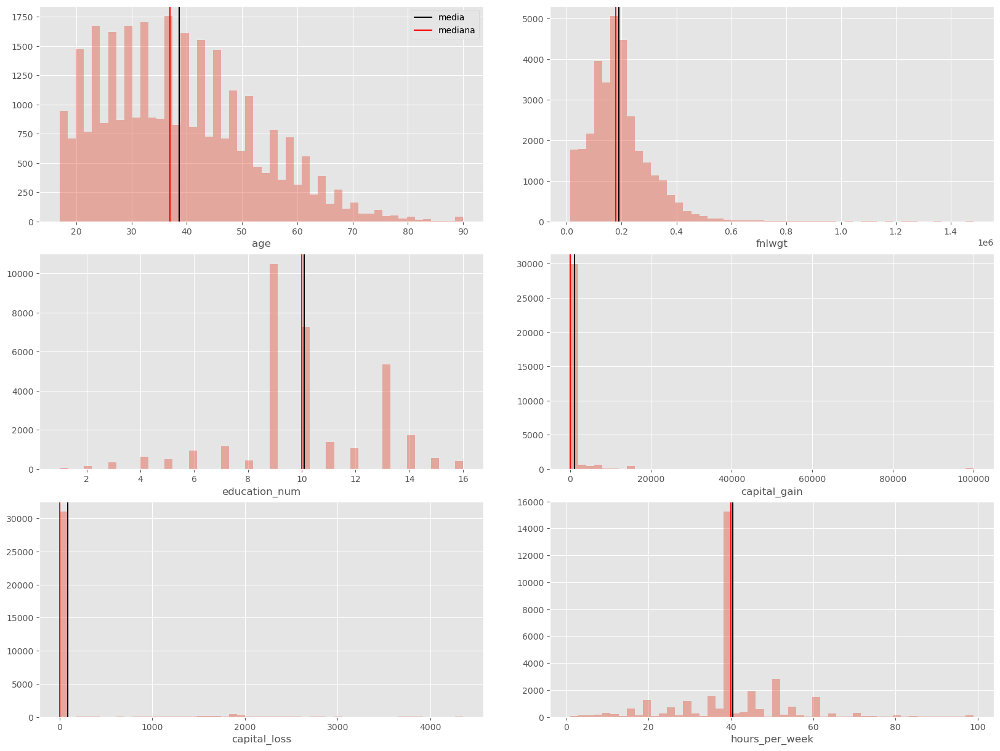

In [14]:
# Distribution for each numerical variable
f,ax = plt.subplots(3,2,figsize=(20,15),gridspec_kw={'wspace':0.15,'hspace':0.15})

ax = ax.ravel()
for i,col in enumerate(numerical):
    sns.distplot(data[col].astype(float),ax=ax[i],kde=False)
    ax[i].axvline(x=data[col].mean(),color='k',label='media')
    ax[i].axvline(x=data[col].median(),color='r',label='mediana')    
ax[0].legend();


In [15]:
print('Quantile  91 capital gain:',data['capital_gain'].quantile(0.91))
print('Quantile  92 capital gain:',data['capital_gain'].quantile(0.92))
print('Quantile  95 capital loss:',data['capital_loss'].quantile(0.95))
print('Quantile  96 capital loss:',data['capital_loss'].quantile(0.96))


Quantile  91 capital gain: 0.0
Quantile  92 capital gain: 1471.0
Quantile  95 capital loss: 0.0
Quantile  96 capital loss: 1590.0


- As shown, the mean age is approximately 38 years, ranging from 18 to 90 years old. This variable has positive asymmetry, i.e. there is more concentration of people with low ages (to the left of the mean), and the heavy tail of the graph represents that there are more values different from the mean to the right than to the left.
- Capital Gain ranges from 0 to 9999. However, up to quantile 91, this variable is at 0, and only after 92 does it take a different value. Therefore, the mean of 1078 is distorted by the extreme values, i.e. by those with the highest gains.
- Capital Loss ranges from 0 to 4356. However, up to quantile 96, this variable is at 0, and only after 96 does it take a different value. Therefore, the mean of 87 is distorted by the extreme values, i.e. by those with higher losses.

A good way to perform the exploratory analysis and to get suggestions on where to do more in-depth analysis is to use the `Pandas Profiling Report`. This report summarizes the exploratory analysis of each variable of the dataset and also its relationships interactively in its different tabs.

In [16]:
pp.ProfileReport(data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

- Overview:
Duplicate cells will not be removed because they may correspond to different persons.
Null values will be imputed in the next step.
- Variables:
 For the categorical variables, the most frequent categories can be observed:
 
  workclass: 70% of the sample works in the private sector.
 
  education: 32% of the sample is a high school graduate
 
  marital status: 70% of the sample is civilly married
 
  occupation: 12.7% of the sample is a professional with a specialty
 
  relationship: 40% of the sample is a husband
 
  race: 85% of the sample is white
 
  sex: 70% of the sample is male
 
  native country: 89% of the sample is native to the United States
 
  income (target variable): 76% of the sample has an income less than or equal to $50k, while 24% have a higher income (classes are unbalanced)
 
 
- Interactions:
 No trends are observed when looking at the interaction of quantitative variables.
- Overview-Alerts:
I will delve into the relationship between income - relationship and age - marital_status as they claim to have a high correlation.  

#### Distributions of numerical variables

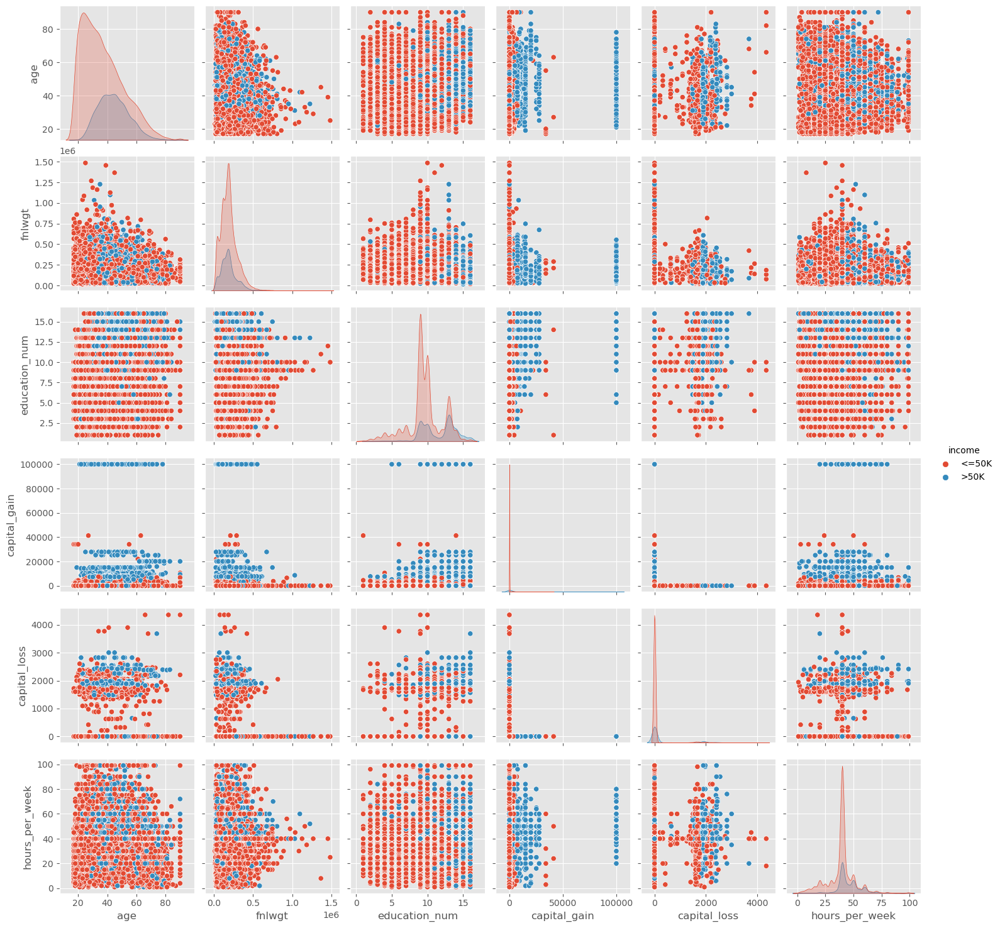

In [17]:
sns.pairplot(data=data, vars=numerical, hue='income');

##### Income - Age

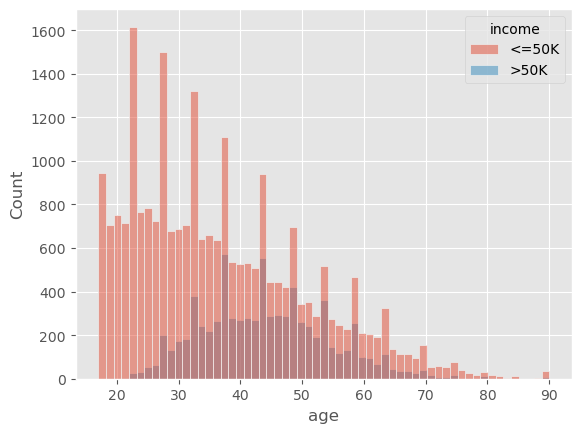

In [18]:
sns.histplot(data= data, x= 'age', hue= 'income');

The highest incomes are seen in people between 30 and 60 years of age.

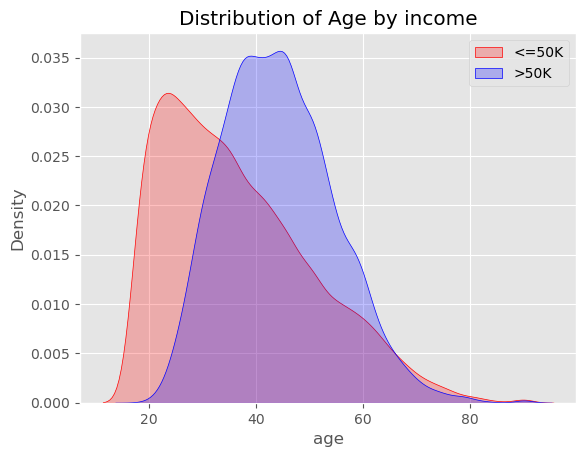

In [19]:
ax = sns.kdeplot(data.age[(data["income"] == '<=50K') ],
                color="Red", shade = True)
ax = sns.kdeplot(data.age[(data["income"] == '>50K') ],
                ax =ax, color="Blue", shade= True)
ax.legend(["<=50K",">50K"],loc='upper right')
ax.set_ylabel('Density')
ax.set_xlabel('age')
ax.set_title('Distribution of Age by income');

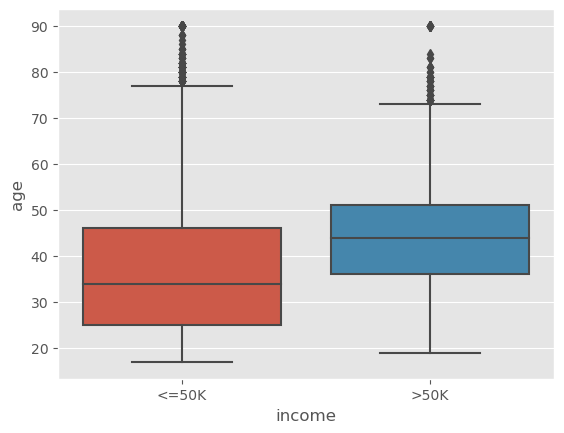

In [20]:
sns.boxplot(x = data.income, y = data.age);

Individuals who have an income above 50K are in an age range with a mean value over 40 years old.

##### Statistical weight - Income

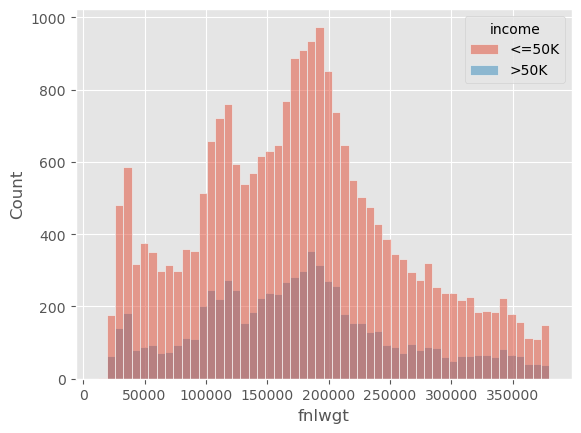

In [21]:
q = np.quantile(data['fnlwgt'],0.95)
m = (data['fnlwgt'] < q)
data_filt = data.loc[m]
sns.histplot(data= data_filt, x= 'fnlwgt', hue= 'income');

##### Education -  Income

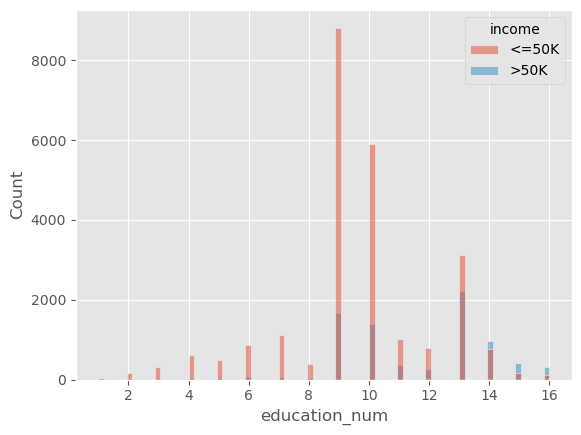

In [22]:
sns.histplot(data= data, x= 'education_num', hue= 'income');

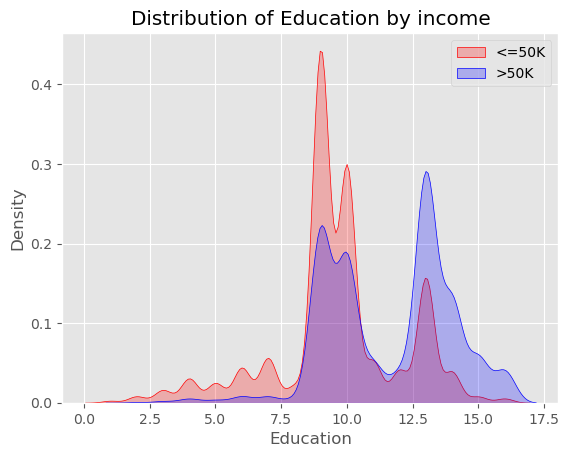

In [23]:
ax = sns.kdeplot(data.education_num[(data["income"] == '<=50K') ],
                color="Red", shade = True)
ax = sns.kdeplot(data.education_num[(data["income"] == '>50K') ],
                ax =ax, color="Blue", shade= True)
ax.legend(["<=50K",">50K"],loc='upper right')
ax.set_ylabel('Density')
ax.set_xlabel('Education')
ax.set_title('Distribution of Education by income');

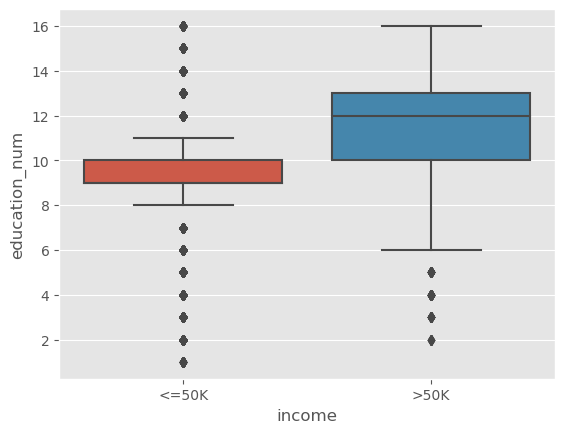

In [24]:
sns.boxplot(x = data.income, y = data.education_num);

Individuals with a higher level of education have, on average, an income above 50 K.

##### Capital Gain - Income

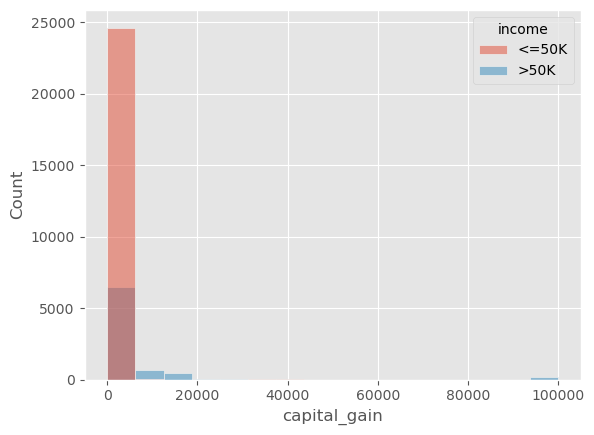

In [25]:
sns.histplot(data= data, x= 'capital_gain', hue= 'income');

In [26]:
data['capital_gain'].value_counts() / len(data['capital_gain'])

0        0.916649
15024    0.010665
7688     0.008729
7298     0.007561
99999    0.004887
           ...   
1111     0.000031
2538     0.000031
22040    0.000031
4931     0.000031
5060     0.000031
Name: capital_gain, Length: 119, dtype: float64

91% of the data is 0 and for income >50K has a higher density between 0 and 35K, with outliers at 100K.

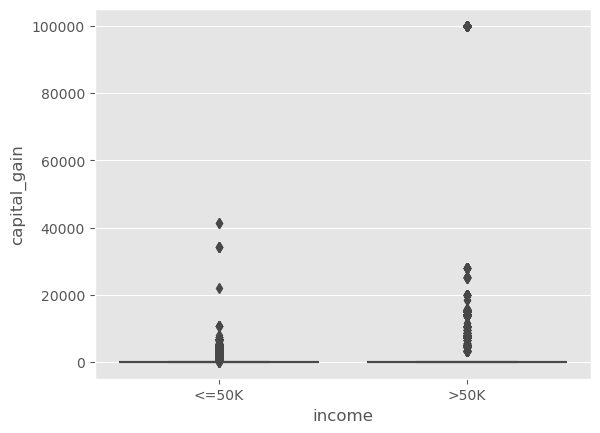

In [27]:
sns.boxplot(x = data.income, y = data.capital_gain);

##### Capital Loss - Income

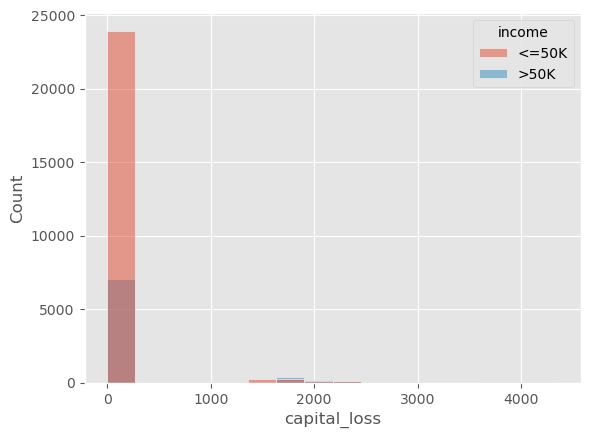

In [28]:
sns.histplot(data= data, x= 'capital_loss', hue= 'income');

In [29]:
data['capital_loss'].value_counts() / len(data['capital_loss'])

0       0.953315
1902    0.006208
1977    0.005163
1887    0.004887
1848    0.001567
          ...   
2080    0.000031
1539    0.000031
1844    0.000031
2489    0.000031
1411    0.000031
Name: capital_loss, Length: 92, dtype: float64

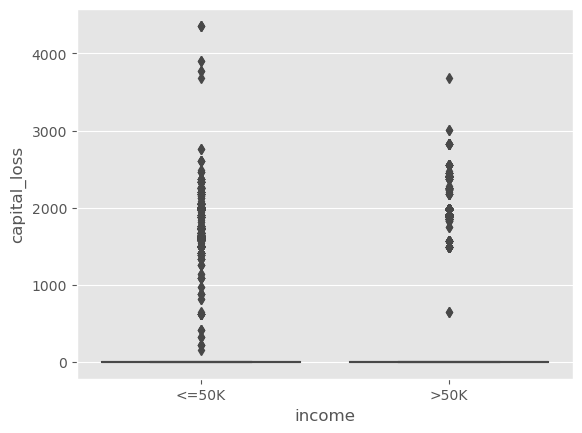

In [30]:
sns.boxplot(x = data.income, y = data.capital_loss);

95% of the values are 0 and a higher density of outliers for income <=50K

##### Hours per week - Income

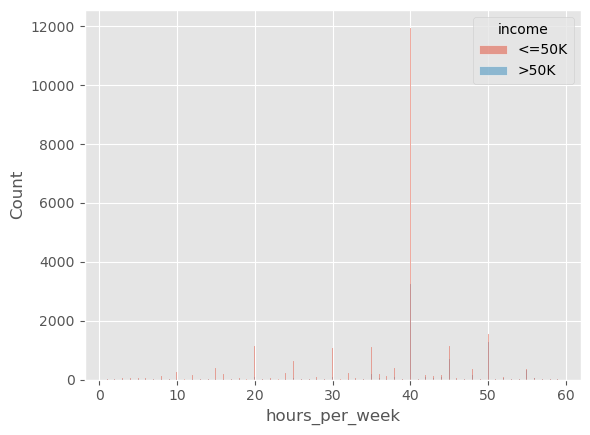

In [31]:
q = np.quantile(data['hours_per_week'],0.95)
m = (data['hours_per_week'] < q)
data_filt = data.loc[m]
sns.histplot(data= data_filt, x= 'hours_per_week', hue= 'income');

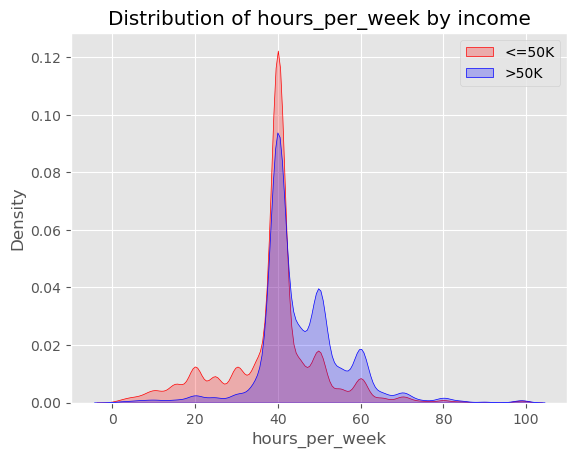

In [32]:
ax = sns.kdeplot(data.hours_per_week[(data["income"] == '<=50K') ],
                color="Red", shade = True)
ax = sns.kdeplot(data.hours_per_week[(data["income"] == '>50K') ],
                ax =ax, color="Blue", shade= True)
ax.legend(["<=50K",">50K"],loc='upper right')
ax.set_ylabel('Density')
ax.set_xlabel('hours_per_week')
ax.set_title('Distribution of hours_per_week by income');

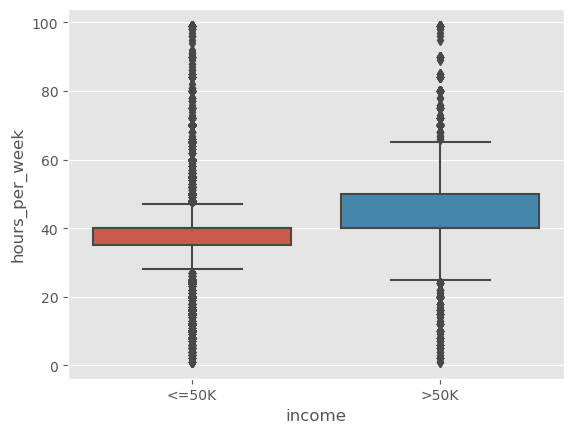

In [33]:
sns.boxplot(x = data.income, y = data.hours_per_week);

Individuals who work more hours per week have an average income >50K.

##### Hours worked by gender

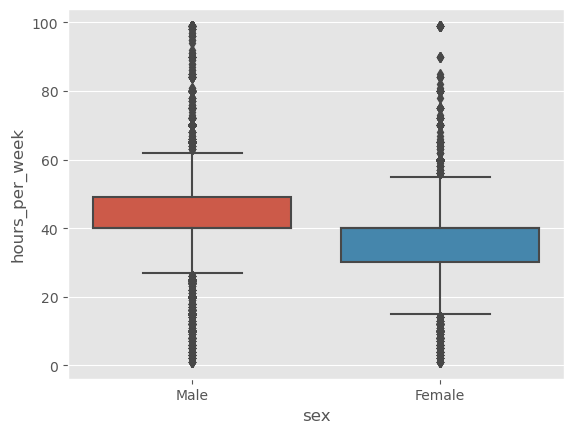

In [34]:
sns.boxplot(x = data.sex, y = data.hours_per_week);

Men work on average more hours per week than women

#### Barplots of categorical variables conditioned by income

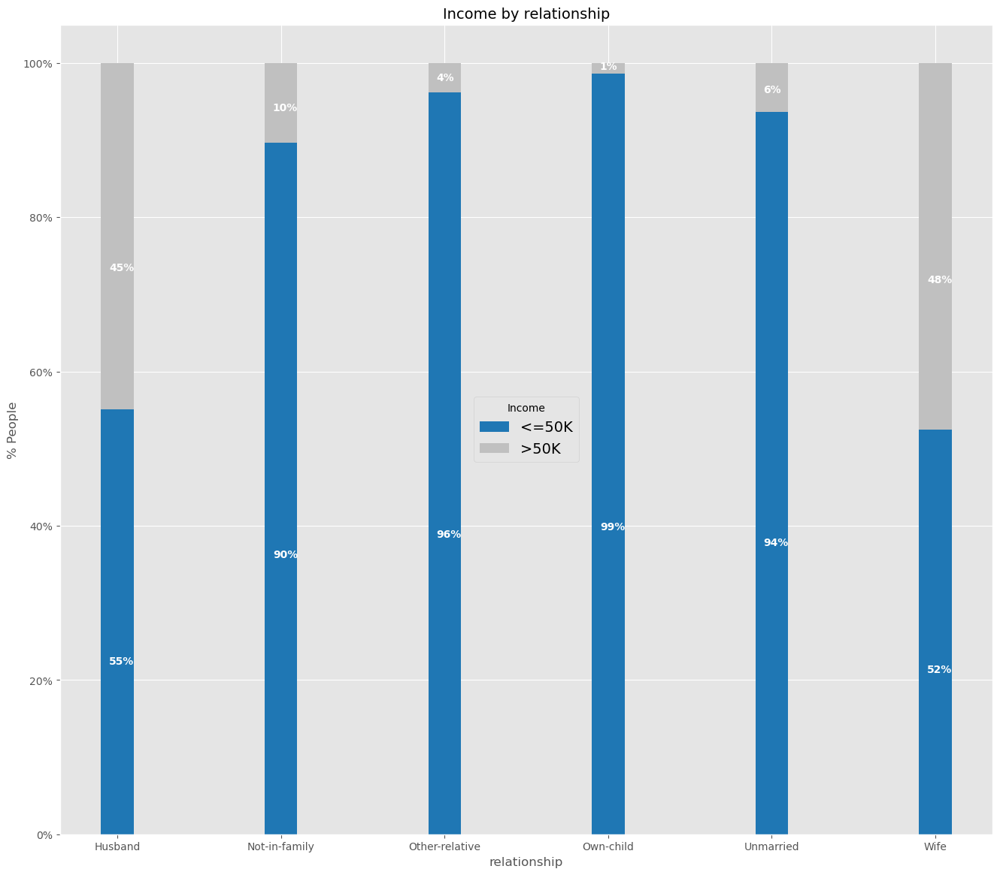

In [35]:
#Income - Relationship
colors = ['#1f77b4','#C0C0C0']
relationship_income = data.groupby(['relationship','income']).size().unstack()

ax = (relationship_income.T*100.0 / relationship_income.T.sum()).T.plot(kind='bar',
                                                                width = 0.2,
                                                                stacked = True,
                                                                rot = 0, 
                                                                figsize = (16,14),
                                                                color = colors)
ax.yaxis.set_major_formatter(mtick.PercentFormatter())
ax.legend(loc='center',prop={'size':14},title = 'Income')
ax.set_ylabel('% People')
ax.set_title('Income by relationship',size = 14)

for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    ax.annotate('{:.0f}%'.format(height), (p.get_x()+.25*width, p.get_y()+.4*height),
                color = 'white',
               weight = 'bold',size =10)

Over 50% of people who are married have an income of more than 50k

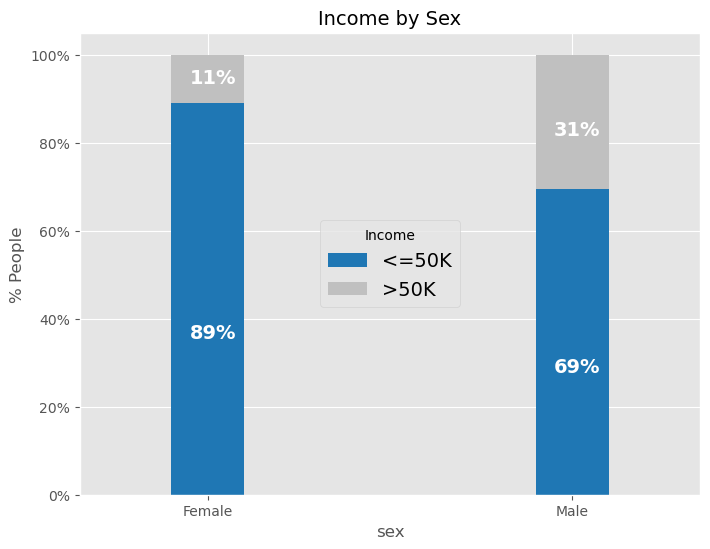

In [36]:
#Income - Sex
colors = ['#1f77b4','#C0C0C0']
sex_income = data.groupby(['sex','income']).size().unstack()

ax = (sex_income.T*100.0 / sex_income.T.sum()).T.plot(kind='bar',
                                                                width = 0.2,
                                                                stacked = True,
                                                                rot = 0, 
                                                                figsize = (8,6),
                                                                color = colors)
ax.yaxis.set_major_formatter(mtick.PercentFormatter())
ax.legend(loc='center',prop={'size':14},title = 'Income')
ax.set_ylabel('% People')
ax.set_title('Income by Sex',size = 14)

for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    ax.annotate('{:.0f}%'.format(height), (p.get_x()+.25*width, p.get_y()+.4*height),
                color = 'white',
               weight = 'bold',size =14)

A higher percentage of men than women have incomes over 50k

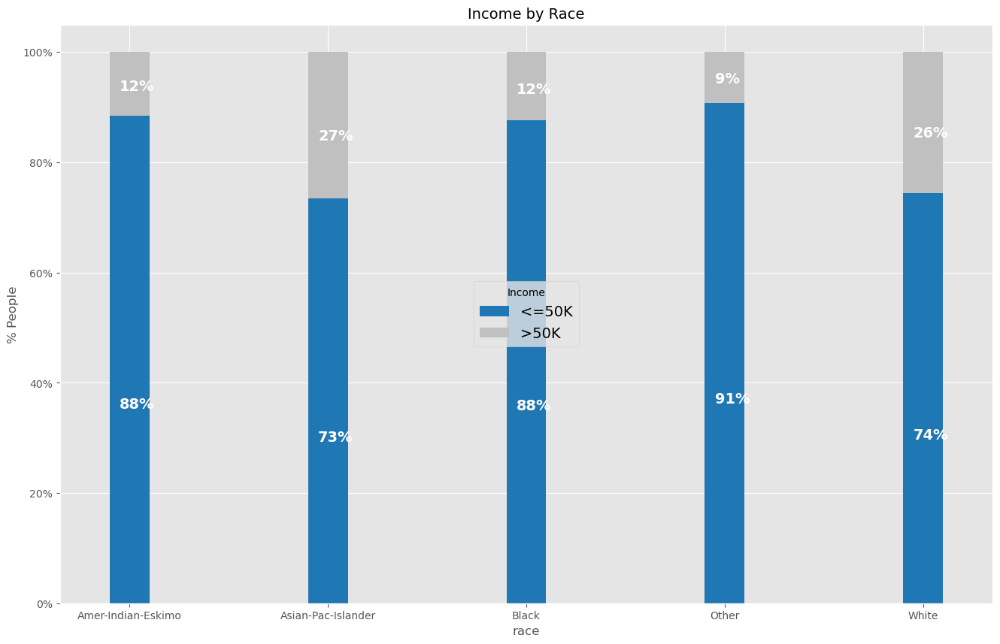

In [37]:
colors = ['#1f77b4','#C0C0C0']
race_income = data.groupby(['race','income']).size().unstack()

ax = (race_income.T*100.0 / race_income.T.sum()).T.plot(kind='bar',
                                                                width = 0.2,
                                                                stacked = True,
                                                                rot = 0, 
                                                                figsize = (16,10),
                                                                color = colors)
ax.yaxis.set_major_formatter(mtick.PercentFormatter())
ax.legend(loc='center',prop={'size':14},title = 'Income')
ax.set_ylabel('% People')
ax.set_title('Income by Race',size = 14)

for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    ax.annotate('{:.0f}%'.format(height), (p.get_x()+.25*width, p.get_y()+.4*height),
                color = 'white',
               weight = 'bold',size =14)

A higher percentage of whites and Asians have an income greater than 50k.

##### Chi-Square test of independence with contingency tables between target and categorical variables.

In [38]:
def chi_square_independence(variable1, variable2):
    relationship=pd.crosstab(data[variable1], data[variable2], normalize='index', margins = False).round(4)*100
    stat,p_value,dof,expected=stats.chi2_contingency(relationship);
    if p_value < 0.05:
        print(f"The H0 that the variables {variable1} and {variable2} are independent is rejected with a confidence level of {round((1-p_value)*100,2)}%")
    else:
        print(f"The H0 that the variables {variable1} and {variable2} are independent cannot be rejected with a confidence level of {round((1-p_value)*100,2)}%")

In [39]:
chi_square_independence('income', 'relationship')

The H0 that the variables income and relationship are independent is rejected with a confidence level of 100.0%


In [40]:
chi_square_independence('income', 'race')

The H0 that the variables income and race are independent cannot be rejected with a confidence level of 48.75%


In [41]:
chi_square_independence('income', 'marital_status')

The H0 that the variables income and marital_status are independent is rejected with a confidence level of 100.0%


In [42]:
chi_square_independence('income', 'workclass')

The H0 that the variables income and workclass are independent cannot be rejected with a confidence level of 42.21%


In [43]:
chi_square_independence('income', 'occupation')

The H0 that the variables income and occupation are independent is rejected with a confidence level of 99.82%


Given that relationship and marital_status may be correlated, an independence test is also performed on these.

In [44]:
chi_square_independence('relationship', 'marital_status')

The H0 that the variables relationship and marital_status are independent is rejected with a confidence level of 100.0%


I add dummy variables that are more highly correlated with income and eliminate those that are less related.

In [45]:
col=[c for c in data.columns if c not in ['native_country','race','education','marital_status', \
                                          'fnlwgt','workclass']]

In [46]:
data_dummies =pd.get_dummies(data[col], drop_first = True)



##### Analysis of correlations between numerical variables

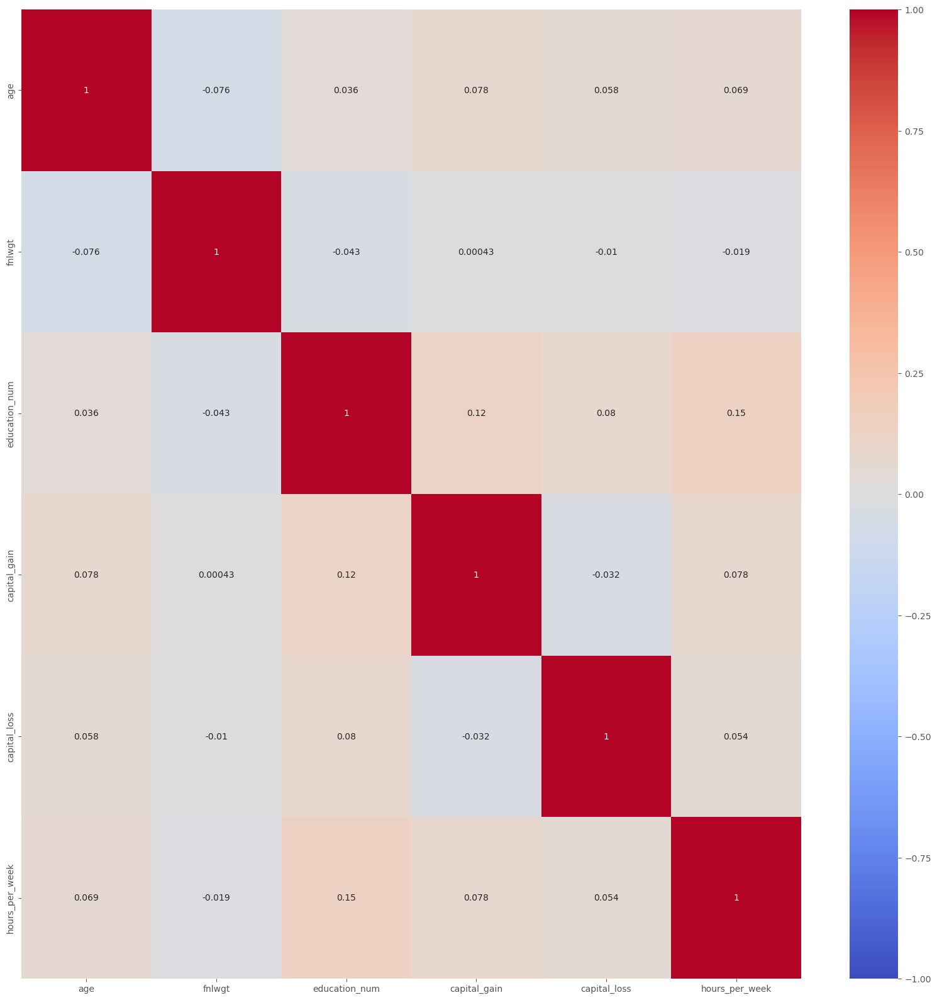

In [47]:
plt.figure(figsize=(20,20))
sns.heatmap(data.corr(),\
                  annot=True, vmin=-1, vmax=1, center= 0, cmap= 'coolwarm');

## Classification


### Train Test split

In [48]:
y = data_dummies['income_>50K']
X = data_dummies.drop(columns = ['income_>50K'])

In [49]:
# Verificamos los shapes y los tipos de X e y:
print("Shape X:", X.shape)
print("Type X:", type(X))
print("Shape y:", y.shape)
print("Type y:", type(y))

Shape X: (32537, 24)
Type X: <class 'pandas.core.frame.DataFrame'>
Shape y: (32537,)
Type y: <class 'pandas.core.series.Series'>


In [50]:
rs=15

X_train, X_test, y_train, y_test = \
                    train_test_split(X, y, stratify=y, test_size=0.25, random_state=rs)

In [51]:
print('X_train.shape: ', X_train.shape)
print('y_train.shape: ', y_train.shape)
print('X_test.shape: ', X_test.shape)
print('y_test.shape: ', y_test.shape)


X_train.shape:  (24402, 24)
y_train.shape:  (24402,)
X_test.shape:  (8135, 24)
y_test.shape:  (8135,)


##### Cape outliers to 99th percentile

In [52]:
capital_loss_p99=X_train['capital_loss'].quantile(0.99)
X_train.loc[X_train['capital_loss']>capital_loss_p99,'capital_loss']=capital_loss_p99
capital_loss_p99=X_test['capital_loss'].quantile(0.99)
X_test.loc[X_test['capital_loss']>capital_loss_p99,'capital_loss']=capital_loss_p99

capital_gain_p99=X_train['capital_gain'].quantile(0.99)
X_train.loc[X_train['capital_gain']>capital_gain_p99,'capital_gain']=capital_gain_p99
capital_gain_p99=X_test['capital_gain'].quantile(0.99)
X_test.loc[X_test['capital_gain']>capital_gain_p99,'capital_gain']=capital_gain_p99

##### Standarization

In [53]:
scaler = StandardScaler()

X_train = pd.DataFrame(scaler.fit_transform(X_train), index=X_train.index, \
                           columns= X_train.columns)

X_test = pd.DataFrame(scaler.transform(X_test), index=X_test.index, \
                           columns= X_test.columns)

#### Logistic Regression

In [54]:
log_reg = LogisticRegression()

In [55]:
log_reg.fit(X_train, y_train)

y_pred_train_proba = log_reg.predict_proba(X_train)

y_pred_test = log_reg.predict(X_test)

In [56]:
y_pred_train = log_reg.predict(X_train)

In [57]:
log_reg.coef_

array([[ 0.36633334,  0.67681923,  0.89385762,  0.26555193,  0.37311579,
        -0.08149303,  0.0667436 ,  0.32694399, -0.16259359, -0.09268073,
        -0.03810819, -0.2229549 , -0.1511047 ,  0.23581705,  0.09624297,
         0.14353796,  0.15343965,  0.01242842, -0.84655317, -0.32788209,
        -1.05791332, -0.57943333,  0.25900195,  0.33101809]])

In [58]:
y_train.shape

(24402,)

In [59]:
print('Accuracy on training set = {:.4f}'.format(accuracy_score(y_train, \
                                                                       y_pred_train)))

print('Accuracy on test set = {:.4f}'.format(accuracy_score(y_test, \
                                                                       y_pred_test)))

Accuracy on training set = 0.8493
Accuracy on test set = 0.8516


#### Hyperparameter optimization via Gridsearch and Cross Validation

In [60]:
log_reg_opt = LogisticRegression(max_iter=10_000)

# We define the hyperparameter search space with a dictionary:
param_grid = [{'solver': ['lbfgs', 'liblinear','newton-cg', 'sag'], 
               'penalty': ['l2'], 
               'C':[0.1, 1, 10, 20, 30]},
              {'solver': ['liblinear'], 
               'penalty':[ 'l1'], 
               'C':[0.01, 0.05, 0.075, 0.1, 1, 0.25, 0.75]}]

print(param_grid)

[{'solver': ['lbfgs', 'liblinear', 'newton-cg', 'sag'], 'penalty': ['l2'], 'C': [0.1, 1, 10, 20, 30]}, {'solver': ['liblinear'], 'penalty': ['l1'], 'C': [0.01, 0.05, 0.075, 0.1, 1, 0.25, 0.75]}]


I define the cross-validation strategy using Stratified K-Folds cross-validator by dividing into 5 splits

In [61]:
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=12)

GridSearchCV + Stratified k-folds

In [62]:
grid = GridSearchCV(log_reg_opt, param_grid, cv=skf, n_jobs=-1, verbose=1)
grid.fit(X_train, y_train)

Fitting 5 folds for each of 27 candidates, totalling 135 fits


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=12, shuffle=True),
             estimator=LogisticRegression(max_iter=10000), n_jobs=-1,
             param_grid=[{'C': [0.1, 1, 10, 20, 30], 'penalty': ['l2'],
                          'solver': ['lbfgs', 'liblinear', 'newton-cg', 'sag']},
                         {'C': [0.01, 0.05, 0.075, 0.1, 1, 0.25, 0.75],
                          'penalty': ['l1'], 'solver': ['liblinear']}],
             verbose=1)

In [63]:
print(grid.best_estimator_)
print(grid.best_score_)

# Best  hyperparameters
print(grid.best_params_)

LogisticRegression(C=0.01, max_iter=10000, penalty='l1', solver='liblinear')
0.8491109387017575
{'C': 0.01, 'penalty': 'l1', 'solver': 'liblinear'}


We observe that the best parameters are for regularization of Lasso L1 with a penalty coefficient C=0.1.

In [64]:
print('coefficients:', grid.best_estimator_.coef_)
print('intercept:', grid.best_estimator_.intercept_)

coefficients: [[ 0.31276049  0.6353236   0.77992763  0.2316888   0.321907    0.
   0.          0.25188914 -0.12467341 -0.05606158 -0.0293203  -0.15876308
   0.          0.15692411  0.04835967  0.06822913  0.09082296  0.
  -0.75543858 -0.2343082  -0.8035702  -0.49463134  0.2012338   0.27183156]]
intercept: [-1.78822426]


In [65]:
grid.best_estimator_.class_weight

Since the regularization method is L1, we analyze if any coefficient is 0:

In [66]:
len(grid.best_estimator_.coef_[grid.best_estimator_.coef_ == 0])

4

AxesSubplot(0.125,0.11;0.775x0.77)


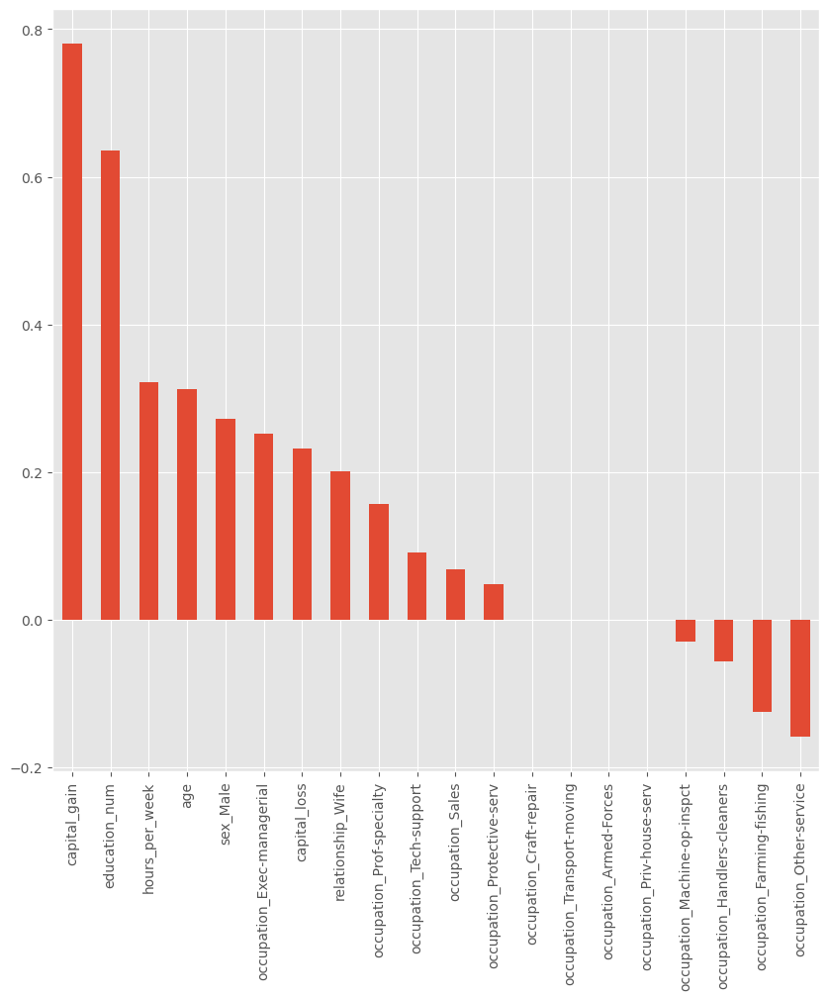

In [67]:
plt.figure(figsize=(10,10))
coeficientes = pd.Series(grid.best_estimator_.coef_[0],
                 index=X_train.columns.values)
print(coeficientes.sort_values(ascending = False)[:20].plot(kind='bar'));

### Model Performance

##### Accuracy_score

In [68]:
y_pred_train = grid.predict(X_train)
print ('Accuracy Train:', accuracy_score(y_train,y_pred_train).round(4))

y_pred_test = grid.predict(X_test)
print ('Accuracy Test:', accuracy_score(y_test,y_pred_test).round(4))

Accuracy Train: 0.8493
Accuracy Test: 0.8516


Before any conclusions, we must evaluate how the classes are balanced regarding the target.

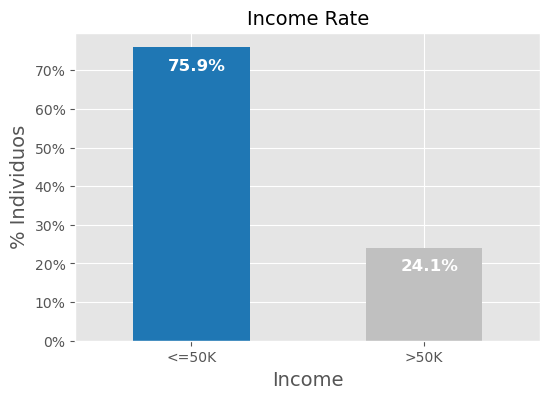

In [69]:
colors = ['#1f77b4','#C0C0C0']
ax = (data['income'].value_counts()*100.0 /len(data)).plot(kind='bar',
                                                                           stacked = True,
                                                                          rot = 0,
                                                                          color = colors,
                                                                         figsize = (6,4))
ax.yaxis.set_major_formatter(mtick.PercentFormatter())
ax.set_ylabel('% Individuos',size = 14)
ax.set_xlabel('Income',size = 14)
ax.set_title('Income Rate', size = 14)


totals = []


for i in ax.patches:
    totals.append(i.get_width())

total = sum(totals)

for i in ax.patches:
    ax.text(i.get_x()+.15, i.get_height()-6.0, \
            str(round((i.get_height()/total), 1))+'%',
            fontsize=12,
            color='white',
            weight = 'bold',)

Since the classes are unbalanced, we cannot consider accuracy as a reliable metric.

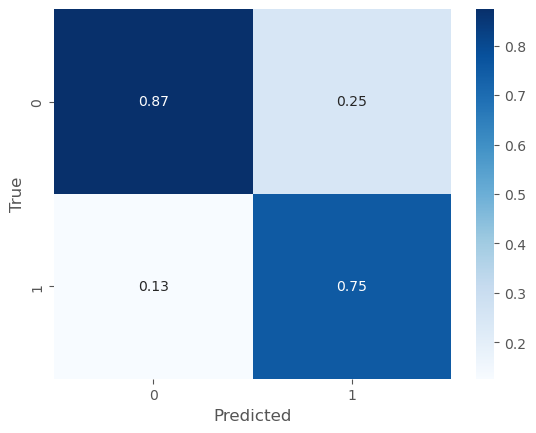

In [70]:
sns.heatmap(confusion_matrix(y_test, y_pred_test, normalize="pred"), annot=True, cmap="Blues")
plt.ylabel('True')
plt.xlabel('Predicted');

##### Evaluation with ROC and AUC curves

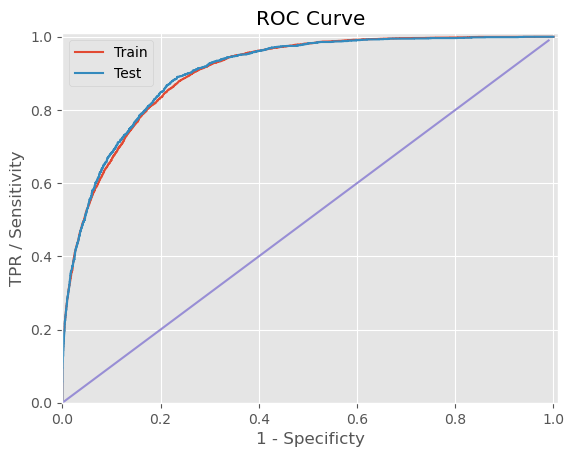

In [71]:
y_proba_train = grid.predict_proba(X_train)
y_proba_test = grid.predict_proba(X_test) 


fpr_train, tpr_train, thr_train = roc_curve(y_train, y_proba_train[:,1])
fpr_test,tpr_test,thr_test = roc_curve(y_test, y_proba_test[:,1])

plt.axis([0, 1.01, 0, 1.01])
plt.xlabel('1 - Specificty')
plt.ylabel('TPR / Sensitivity')
plt.title('ROC Curve')
plt.plot(fpr_train,tpr_train)
plt.plot(fpr_test,tpr_test)
plt.plot(np.arange(0,1, step =0.01), np.arange(0,1, step =0.01))
plt.legend(['Train','Test'])
plt.show() 

In [72]:
print('AUC Train=', auc(fpr_train,tpr_train))
print('AUC Test=', auc(fpr_test,tpr_test))

AUC Train= 0.9032910101412883
AUC Test= 0.9052514252664629


We can observe a favorable AUC performance above 90%. In addition, the model is generalizing well according to the value of the metric we observed for Test. 

#### KNN

In [73]:
knn = KNeighborsClassifier()

In [74]:
# We define the hyperparameter search space with a dictionary:
k_range = list(range(20, 50,5))
param_grid = {'n_neighbors':k_range, \
              'p':[1, 2],
               'weights':['uniform', 'distance']}

print(param_grid)

{'n_neighbors': [20, 25, 30, 35, 40, 45], 'p': [1, 2], 'weights': ['uniform', 'distance']}


In [75]:
grid_knn = GridSearchCV(knn, param_grid, cv=skf, n_jobs=-1, verbose=1)
grid_knn.fit(X_train, y_train)

Fitting 5 folds for each of 24 candidates, totalling 120 fits


/Users/franciscomorales/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
/Users/franciscomorales/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value

/Users/franciscomorales/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
/Users/franciscomorales/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value

/Users/franciscomorales/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
/Users/franciscomorales/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value

/Users/franciscomorales/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
/Users/franciscomorales/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=12, shuffle=True),
             estimator=KNeighborsClassifier(), n_jobs=-1,
             param_grid={'n_neighbors': [20, 25, 30, 35, 40, 45], 'p': [1, 2],
                         'weights': ['uniform', 'distance']},
             verbose=1)

In [76]:
print(grid_knn.best_estimator_)
print(grid_knn.best_score_)
print(grid_knn.best_params_)

KNeighborsClassifier(n_neighbors=40)
0.8473487527750627
{'n_neighbors': 40, 'p': 2, 'weights': 'uniform'}


##### KNN - Accuracy_score

In [77]:
y_pred_train = grid_knn.predict(X_train)
print ('Accuracy KNN Train:', accuracy_score(y_train,y_pred_train).round(4))

y_pred_test = grid_knn.predict(X_test)
print ('Accuracy KNN Test:', accuracy_score(y_test,y_pred_test).round(4))


Accuracy KNN Train: 0.8545
Accuracy KNN Test: 0.8521


##### KNN - ROC curve and AUC

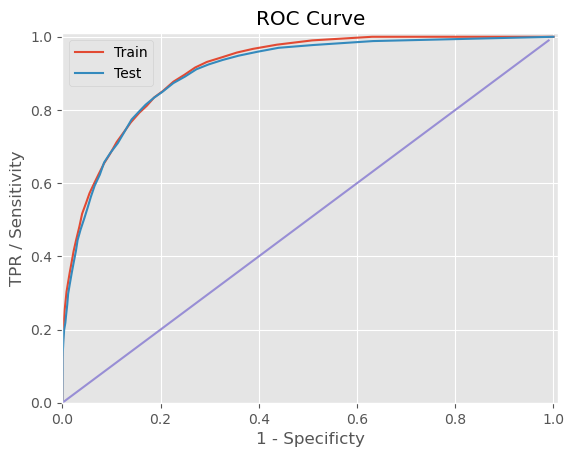

In [78]:
y_proba_train_knn = grid_knn.predict_proba(X_train)
y_proba_test_knn = grid_knn.predict_proba(X_test) 


fpr_train_knn, tpr_train_knn, thr_train_knn = roc_curve(y_train, y_proba_train_knn[:,1])
fpr_test_knn,tpr_test_knn,thr_test_knn = roc_curve(y_test, y_proba_test_knn[:,1])

plt.axis([0, 1.01, 0, 1.01])
plt.xlabel('1 - Specificty')
plt.ylabel('TPR / Sensitivity')
plt.title('ROC Curve')
plt.plot(fpr_train_knn,tpr_train_knn)
plt.plot(fpr_test_knn,tpr_test_knn)
plt.plot(np.arange(0,1, step =0.01), np.arange(0,1, step =0.01))
plt.legend(['Train','Test'])
plt.show() 

In [79]:
print('AUC Train=', auc(fpr_train_knn,tpr_train_knn))
print('AUC Test=', auc(fpr_test_knn,tpr_test_knn))

AUC Train= 0.911753992546901
AUC Test= 0.9036378170701479


It is observed that in KNN the AUC of Test is lower than in the logistic regression.

#### Naive Bayes

In [80]:
gnb = GaussianNB()
gnb.fit(X_train, y_train);

##### Naive Bayes - Accuracy_score

In [81]:
y_pred_train_nb = gnb.predict(X_train)
print ('Accuracy NB Train:', accuracy_score(y_train,y_pred_train_nb).round(4))

y_pred_test_nb = gnb.predict(X_test)
print ('Accuracy NB Test:', accuracy_score(y_test,y_pred_test_nb).round(4))

Accuracy NB Train: 0.5779
Accuracy NB Test: 0.5833


#### Naive Bayes - ROC curve and AUC

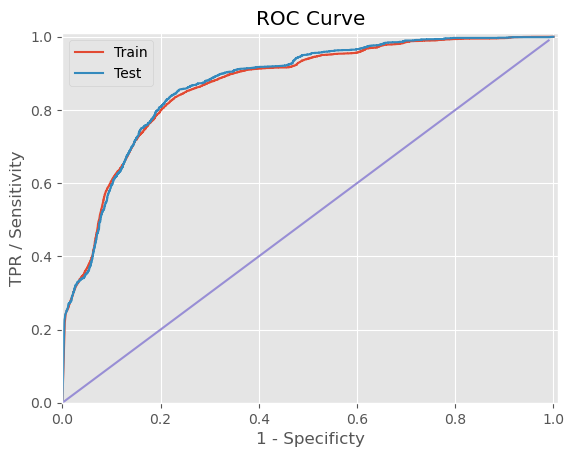

In [82]:
y_proba_train_nb = gnb.predict_proba(X_train)
y_proba_test_nb = gnb.predict_proba(X_test) 

fpr_train_nb, tpr_train_nb, thr_train_nb = roc_curve(y_train, y_proba_train_nb[:,1])
fpr_test_nb,tpr_test_nb,thr_test_nb = roc_curve(y_test, y_proba_test_nb[:,1])

plt.axis([0, 1.01, 0, 1.01])
plt.xlabel('1 - Specificty')
plt.ylabel('TPR / Sensitivity')
plt.title('ROC Curve')
plt.plot(fpr_train_nb,tpr_train_nb)
plt.plot(fpr_test_nb,tpr_test_nb)
plt.plot(np.arange(0,1, step =0.01), np.arange(0,1, step =0.01))
plt.legend(['Train','Test'])
plt.show() 

In [83]:
print('AUC Train=', auc(fpr_train_nb,tpr_train_nb))
print('AUC Test=', auc(fpr_test_nb,tpr_test_nb))

AUC Train= 0.8673271573467177
AUC Test= 0.8712899694290672


####  Comparison of the different models

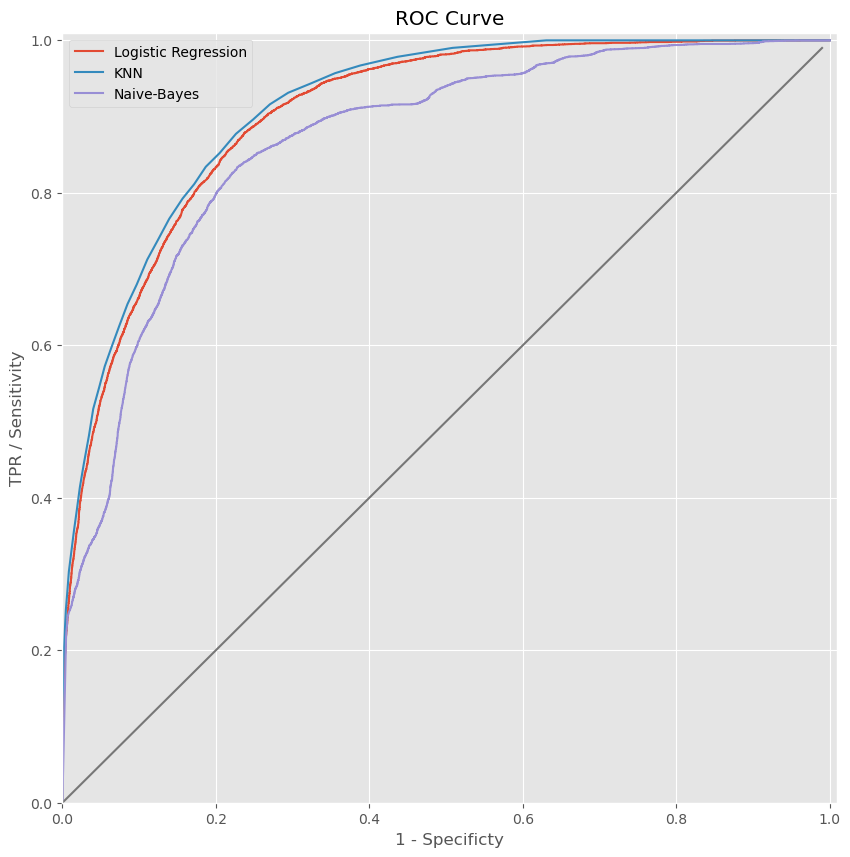

In [84]:
plt.figure(figsize=(10,10))
fpr_log,tpr_log,thr_log = roc_curve(y_train, y_proba_train[:,1])
fpr_knn,tpr_knn,thr_knn = roc_curve(y_train, y_proba_train_knn[:,1])
fpr_nb,tpr_nb,thr_nb = roc_curve(y_train, y_proba_train_nb[:,1])

plt.axis([0, 1.01, 0, 1.01])
plt.xlabel('1 - Specificty')
plt.ylabel('TPR / Sensitivity')
plt.title('ROC Curve')
plt.plot(fpr_log,tpr_log)
plt.plot(fpr_knn,tpr_knn)
plt.plot(fpr_nb,tpr_nb)
plt.plot(np.arange(0,1, step =0.01), np.arange(0,1, step =0.01))
plt.legend(['Logistic Regression','KNN','Naive-Bayes'])
plt.show() 

In [85]:
print('AUC Train Log Reg=', auc(fpr_train,tpr_train))
print('AUC Train KNN=', auc(fpr_train_knn,tpr_train_knn))
print('AUC Train Naive-Bayes=', auc(fpr_train_nb,tpr_train_nb))

AUC Train Log Reg= 0.9032910101412883
AUC Train KNN= 0.911753992546901
AUC Train Naive-Bayes= 0.8673271573467177


The model with the best performance on the train dataset is KNN, however, as we already know, it has a higher computational cost.

## Clustering

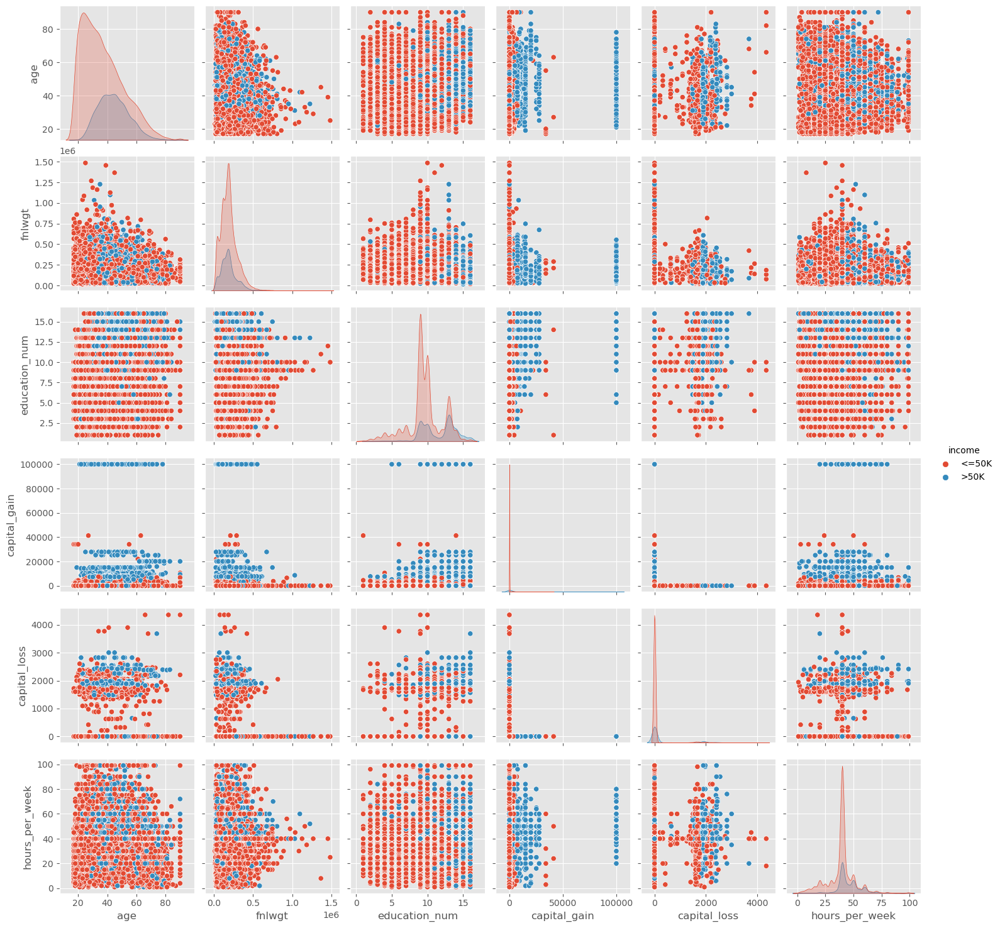

In [86]:
sns.pairplot(data=data, vars=numerical, hue='income');

### Kmeans

In [87]:
capital_loss_p99=data['capital_loss'].quantile(0.99)
data.loc[data['capital_loss']>capital_loss_p99,'capital_loss']=capital_loss_p99

capital_gain_p99=data['capital_gain'].quantile(0.99)
data.loc[data['capital_gain']>capital_gain_p99,'capital_gain']=capital_gain_p99

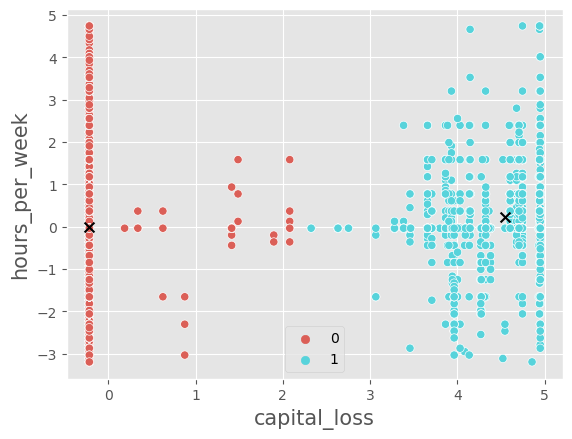

In [88]:
X = data[['capital_loss','hours_per_week']]

scaler=StandardScaler()

X_scaled=scaler.fit_transform(X);

kmeans=KMeans(n_clusters=2,n_init=10,random_state=0)
kmeans.fit(X_scaled)

labels = kmeans.labels_ 
centroids = kmeans.cluster_centers_ 

sns.scatterplot(x=X_scaled[:,0],y=X_scaled[:,1],hue=labels,legend='full',palette=sns.color_palette("hls", 2));
plt.xlabel('capital_loss',fontsize=15);plt.ylabel('hours_per_week',fontsize=15);
plt.scatter(centroids[:,0],centroids[:,1],marker='x',s=50,color='k');

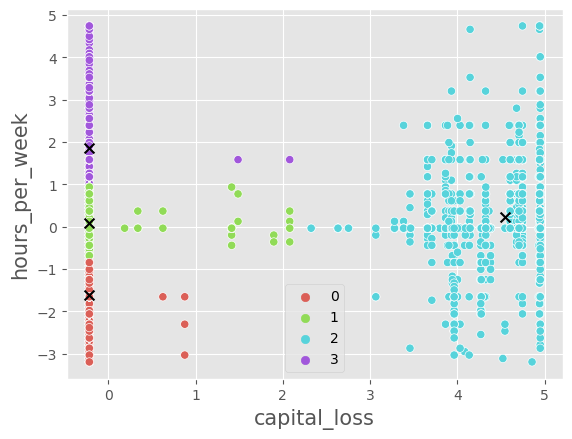

In [89]:
X = data[['capital_loss','hours_per_week']]

scaler=StandardScaler()

X_scaled=scaler.fit_transform(X);

kmeans=KMeans(n_clusters=4,n_init=10,random_state=0) 
kmeans.fit(X_scaled)

labels = kmeans.labels_ 
centroids = kmeans.cluster_centers_ 

sns.scatterplot(x=X_scaled[:,0],y=X_scaled[:,1],hue=labels,legend='full',palette=sns.color_palette("hls", 4));
plt.xlabel('capital_loss',fontsize=15);plt.ylabel('hours_per_week',fontsize=15);
plt.scatter(centroids[:,0],centroids[:,1],marker='x',s=50,color='k');

Some correlation can be found with the target variable.

###  Is there a number of clusters other than 2 that describes best the structure of the data?

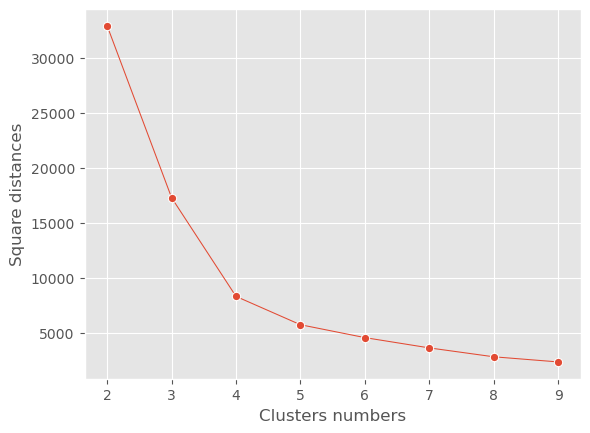

In [90]:
sq_distances = []
k_values = range(2,10);

for k in k_values:
    kmeans=KMeans(n_clusters=k,n_init=10,random_state=0)
    kmeans.fit(X_scaled)
    sq_distances.append(kmeans.inertia_)

sns.lineplot(x=k_values,y=sq_distances,marker='o',size=30,legend=False);
plt.ylabel('Square distances');plt.xlabel('Clusters numbers'); 

Using the "elbow rule" approach, it seems that k=4 is a good choice.

Silhoutte score

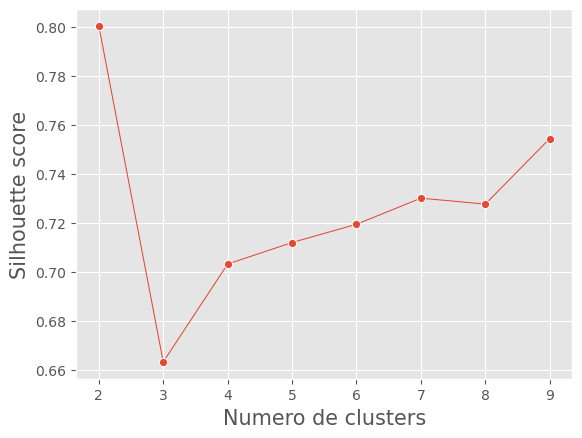

In [91]:
sil=[]
k_values=range(2,10);

for k in k_values:
    kmeans=KMeans(n_clusters=k,n_init=10,random_state=0) # Numero de repeticiones=10
    kmeans.fit(X_scaled)
    score=silhouette_score(X_scaled,kmeans.labels_)
    sil.append(score)

sns.lineplot(x=k_values,y=sil,marker='o',size=30,legend=False);
plt.ylabel('Silhouette score',fontsize=15);plt.xlabel('Numero de clusters',fontsize=15);

The SC value closest to 1 is for n cluster = 2.

For n_clusters = 2 The average silhouette_score is : 0.8004829856607931
For n_clusters = 3 The average silhouette_score is : 0.6633104992064942
For n_clusters = 4 The average silhouette_score is : 0.7032695917685903
For n_clusters = 5 The average silhouette_score is : 0.712053634611697
For n_clusters = 6 The average silhouette_score is : 0.715832181981836
For n_clusters = 7 The average silhouette_score is : 0.7403598031931207
For n_clusters = 8 The average silhouette_score is : 0.7276835781074689
For n_clusters = 9 The average silhouette_score is : 0.7223492245806243


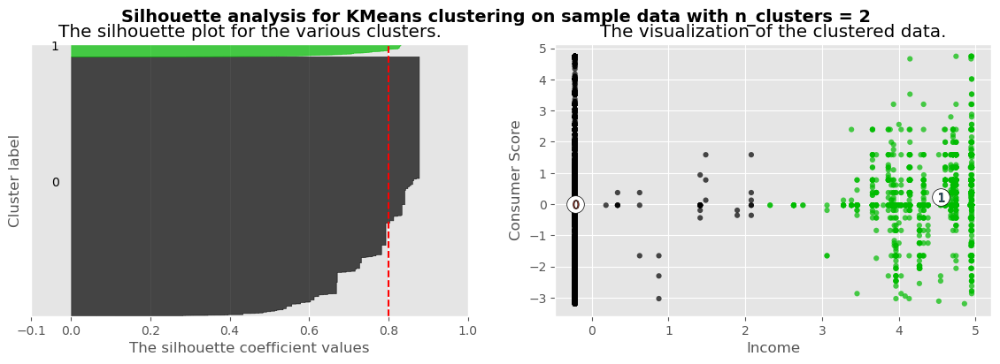

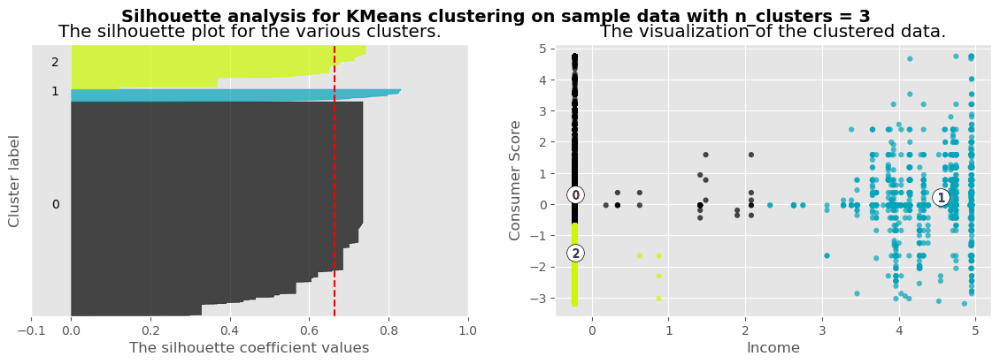

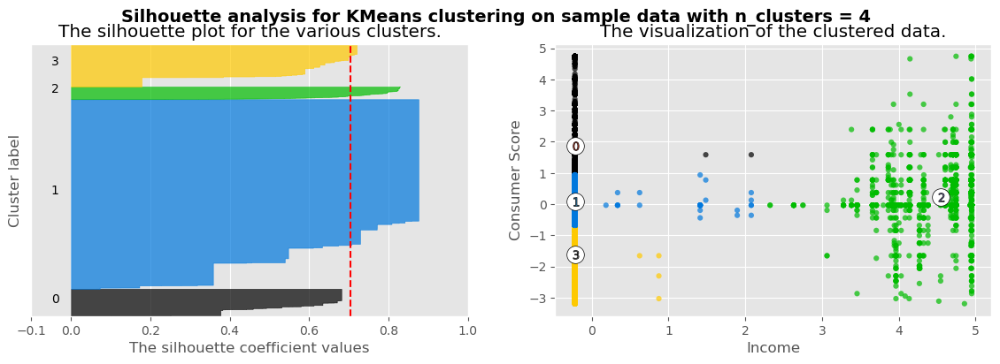

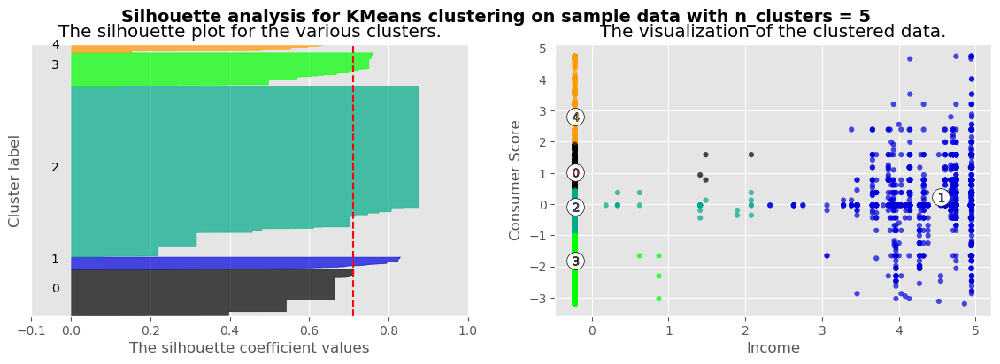

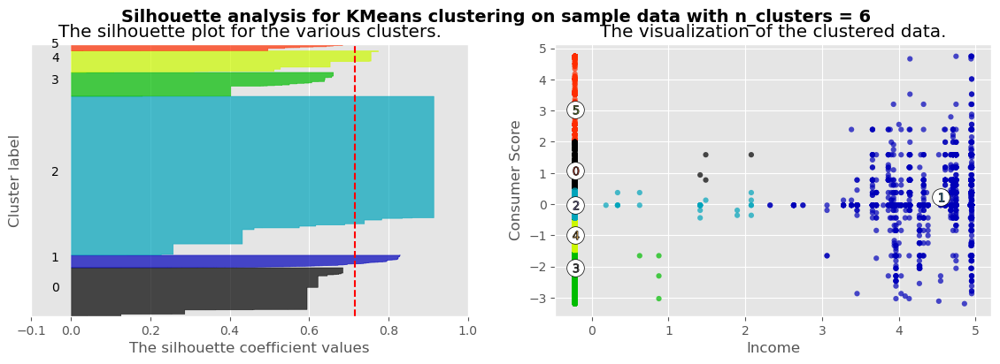

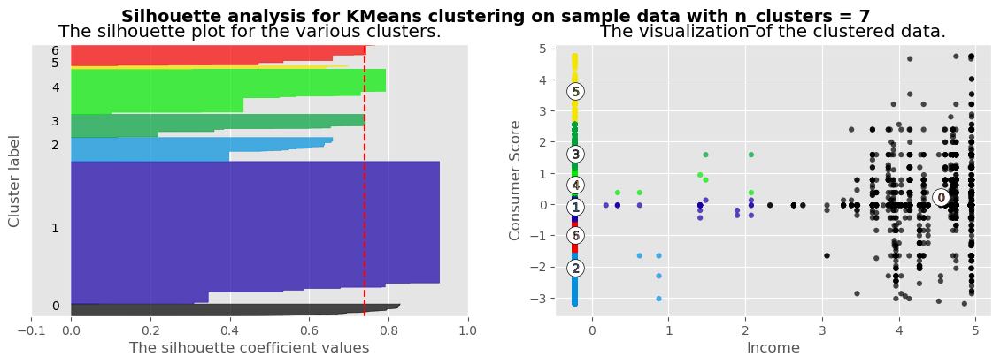

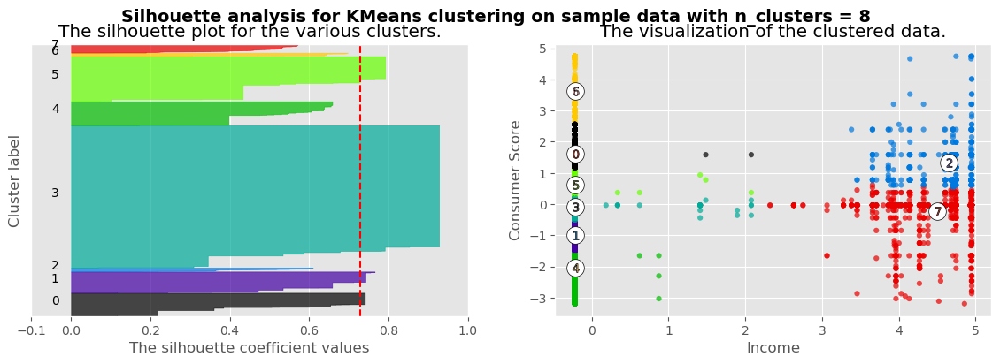

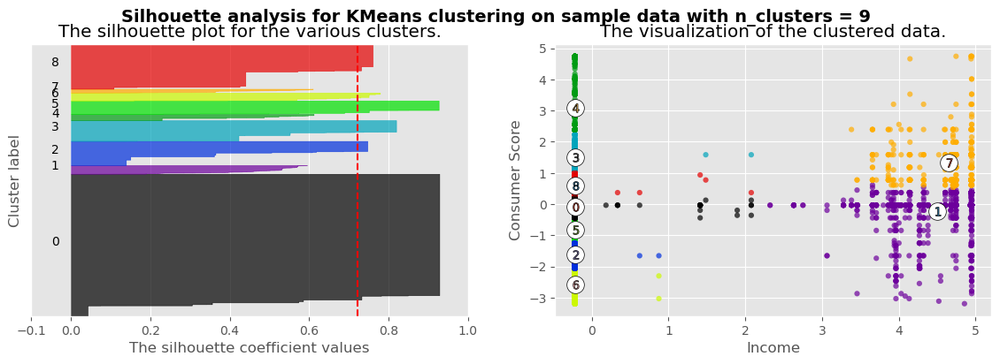

In [92]:
for n_clusters in range(2,10):
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(14, 4)
    
    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X_scaled)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X_scaled, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X_scaled, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X_scaled[:, 0], X_scaled[:, 1], marker='.', s=80, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Income")
    ax2.set_ylabel("Consumer Score")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')
plt.show()

The average SC score is only exceeded for n_cluster 2 and 3.

### Hierarchical Clustering

In [93]:
X = data[['capital_loss','hours_per_week']];

scaler = StandardScaler();

X_sc = scaler.fit_transform(X);

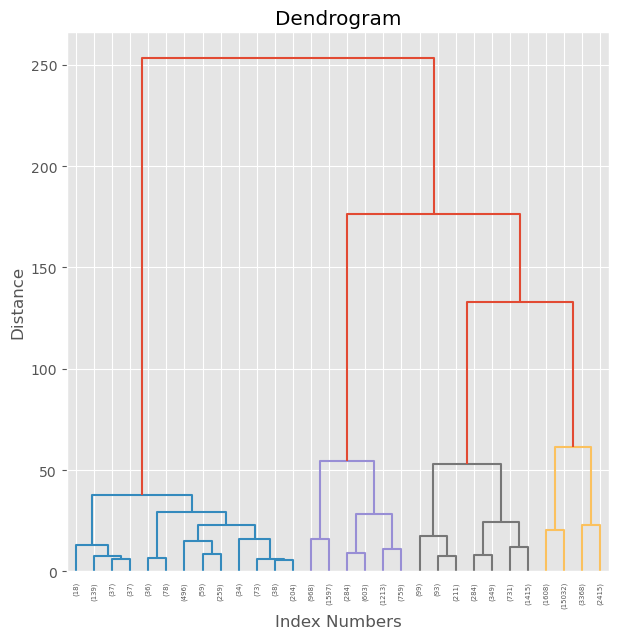

In [94]:
Z = linkage(X_sc, 'ward');

plt.figure(figsize=[7,7])
plt.title('Dendrogram')
plt.xlabel('Index Numbers')
plt.ylabel('Distance')
dendrogram(
    Z,
    leaf_rotation=90.,  
    leaf_font_size=5.,  
    color_threshold=65,
    truncate_mode='lastp'
)
plt.show()


Thus, 4 clusters are defined, each of which has a characteristic “diameter” close to 65. For this reason, this choice of the number of clusters seems appropriate.

We look at the exact composition of each cluster

Cluster labels:
 [4 2 4 ... 4 2 4]


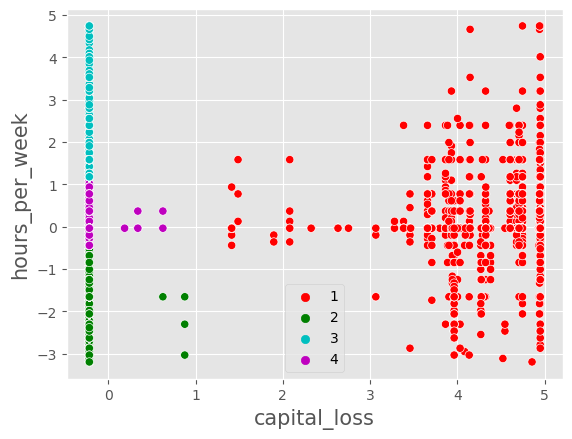

In [95]:
color_palette=['r','g','c','m'];

labels=fcluster(Z,4,criterion='maxclust');

print('Cluster labels:\n',labels)

sns.scatterplot(x=X_sc[:,0],y=X_sc[:,1],hue=labels,legend='full',palette=color_palette);
plt.xlabel('capital_loss',fontsize=15);plt.ylabel('hours_per_week',fontsize=15);

In [96]:
c, dists = cophenet(Z, pdist(X_sc))
print('Cophenetic coefficient:',c)

Cophenetic coefficient: 0.8344221287910275


In [97]:
X = data[['capital_loss','hours_per_week']];

X.shape

(32537, 2)

In [98]:
X_samp = X.sample(frac=0.5)
X_samp.shape

(16268, 2)

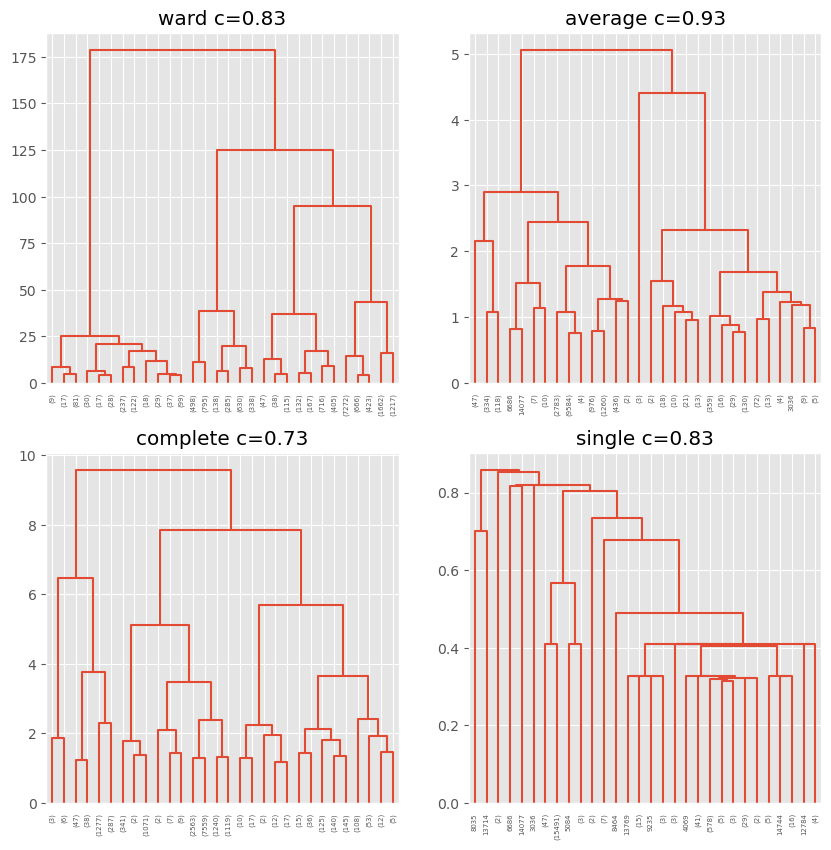

In [99]:
X_sc2 = scaler.fit_transform(X_samp);


def plot_dendrogram(X_sc2,method,ax):
    Z = linkage(X_sc2, method);
    c,dists=cophenet(Z, pdist(X_sc2));
    ax.set_title(method+' c='+str(np.around(c,2)))        
    ax.set_xticklabels([])
    dendrogram(
        Z,
        leaf_rotation=90.,  
        leaf_font_size=5.,  
        color_threshold=0,
        truncate_mode='lastp',
        ax=ax
    )        
    return  



fig,axes=plt.subplots(2,2,figsize=(10,10))

plot_dendrogram(X_sc2,'ward',axes[0,0])
plot_dendrogram(X_sc2,'average',axes[0,1])
plot_dendrogram(X_sc2,'complete',axes[1,0])
plot_dendrogram(X_sc2,'single',axes[1,1])
plt.show()


### DBSCAN

##### <b>$\epsilon$</b> and MinPts election

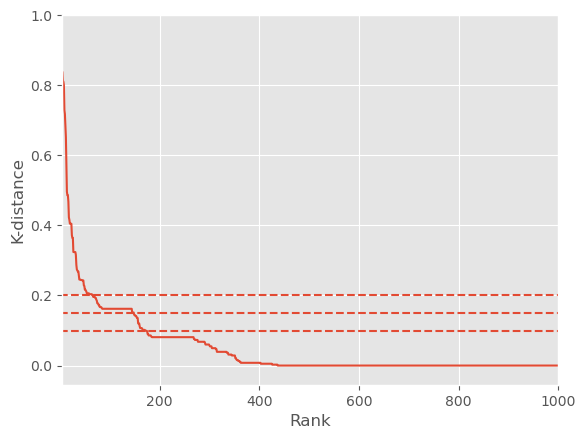

In [100]:
minPts = 4;
k = minPts - 1;

D = squareform(pdist(X_sc));

k_distances = np.zeros(D.shape[0]);

for i in range(D.shape[0]):
    distances = np.sort(D[i]);
    k_distances[i] = distances[k];
k_distances = np.sort(k_distances);
k_distances = k_distances[::-1];
    
plt.plot(k_distances);
plt.xlabel('Rank');
plt.ylabel('K-distance');
plt.autoscale()
plt.xlim(left=5,right=1000);
plt.ylim(top=1);
plt.hlines([0.2,0.15,0.1], 0, 1000, linestyles='dashed');

In [101]:
dbscan = DBSCAN(eps=0.15, min_samples=4)
y_dbscan = dbscan.fit_predict(X_sc)
y_dbscan


core_samples_mask = np.zeros_like(dbscan.labels_, dtype=bool)
core_samples_mask[dbscan.core_sample_indices_] = True

labels = dbscan.labels_
unique_labels=set(labels);

In [102]:
labels = dbscan.labels_
unique_labels=set(labels);

In [103]:
unique_labels

{-1,
 0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56}

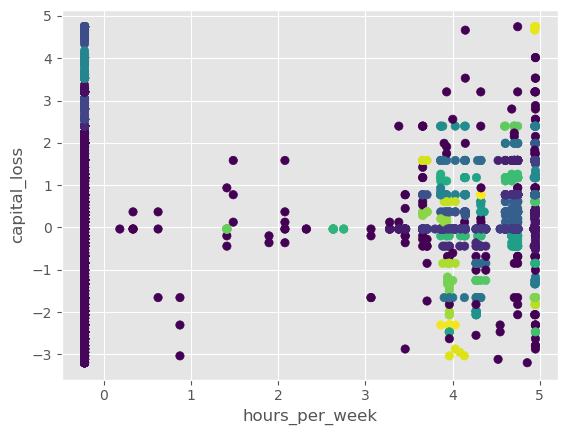

In [104]:
plt.scatter(X_sc[:, 0], X_sc[:,1], c = labels) 
plt.xlabel("hours_per_week") 
plt.ylabel("capital_loss") 
plt.show() 

The clustering performed by DBSCAN is not optimal for the structure of the data. This is due to the fact that the zones of the graph have different densities, being more densely populated at the extremes.

There is a number of clusters other than 2 that best describes the structure of the data and that is with cluster number = 4, this is seen in both hierarchical clusters and k-means. However, the best results are seen in k-means, as at a simple view it defines x and y boundaries that make the most sense for the variables being observed.